<a href="https://colab.research.google.com/github/LennyRBriones/object_detection/blob/main/object_detection_I.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Generating a sliding window

getting an specific version to avoid incompatibility

In [ ]:
!pip install opencv-python-headless==4.7.0.72

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os

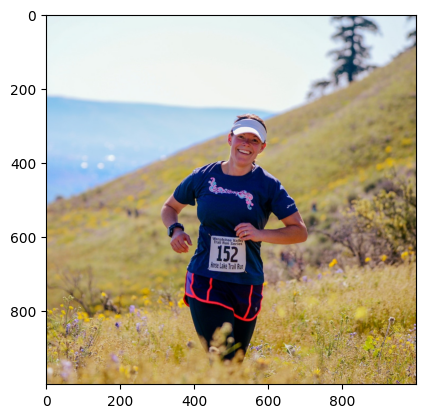

In [ ]:
np_image = cv2.imread("pexels-frank-cone-2330502-cropped_e07fcbdc-984c-4f0a-92ab-8fd298a6101d.jpg") #read the image
np_image = cv2.cvtColor(np_image, cv2.COLOR_BGR2RGB) # color order to rgb
np_image = cv2.resize(np_image, dsize=(1000, 1000))
plt.imshow(np_image)

In [ ]:
def sliding_window(image, step, ws):
  for y in range(0, image.shape[0] -ws[1]+1, step): # range oh the image in 1 +1 to borders
    for x in range(0, image.shape[1] -ws[0]+1, step): # the same in the x layer
      yield (x, y, image[y:y + ws[1], x:x +ws[0]]) # generator of the windows

In [ ]:
windows = sliding_window(np_image, 200, (200, 200))

In [ ]:
os.makedirs("sliding_window")

<ipython-input-13-a1dbe012f78f>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axarr = plt.subplots(1, 2, figsize=(12, 12))


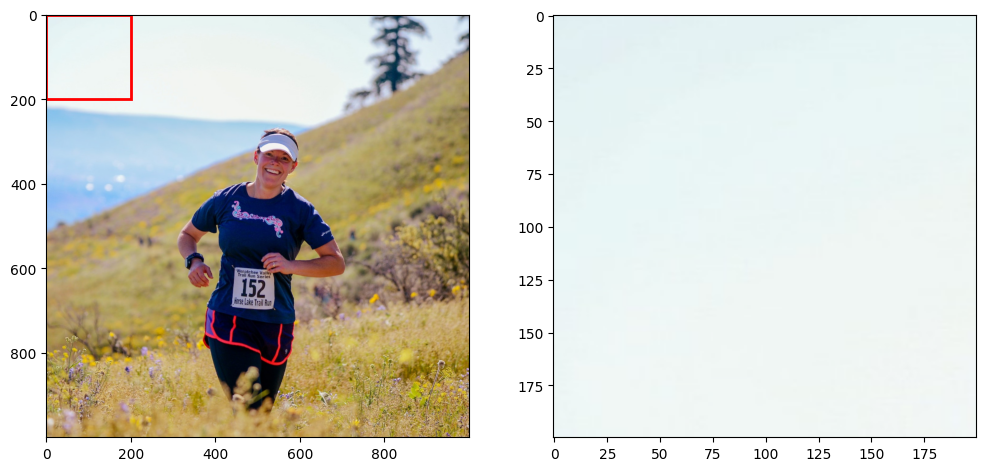

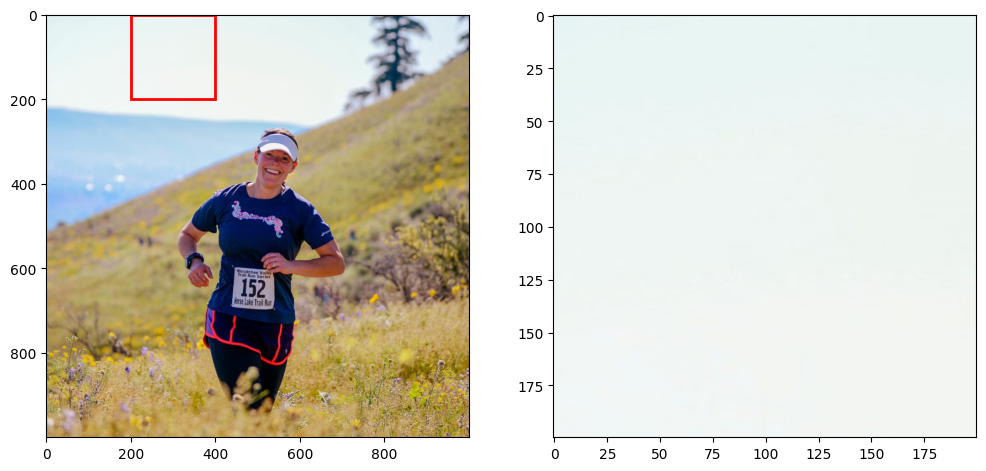

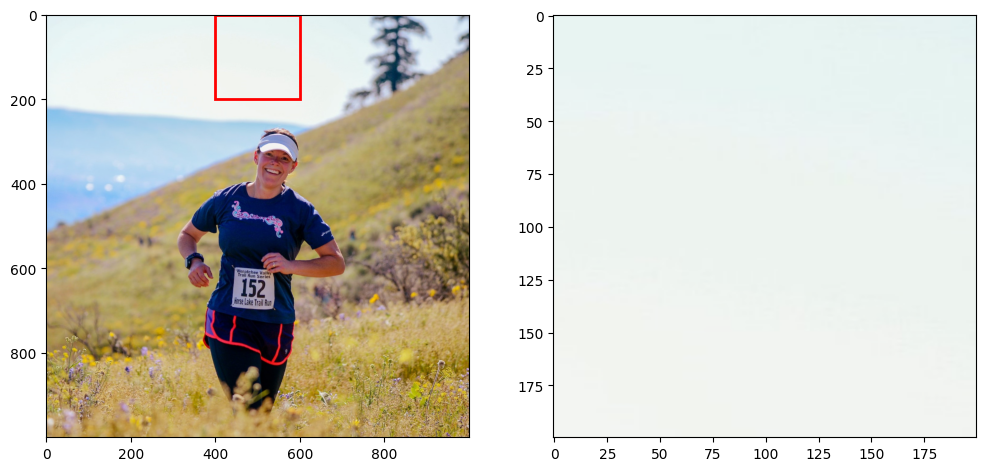

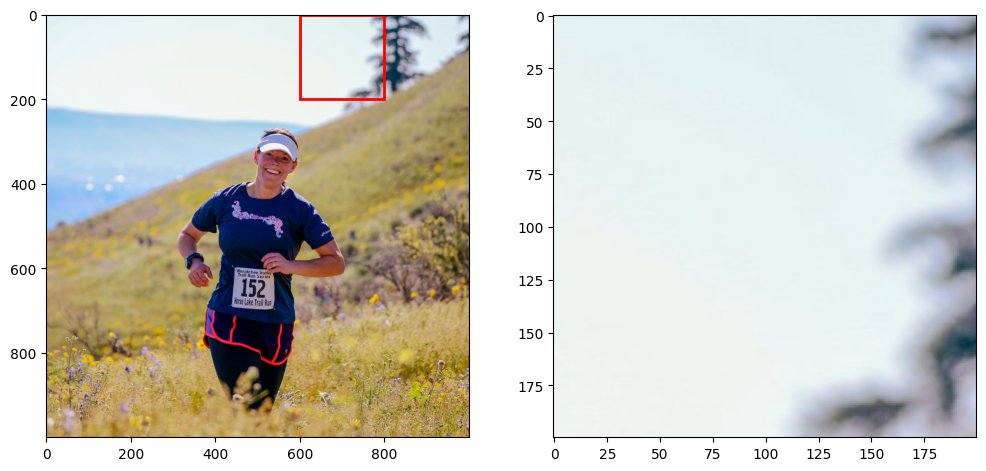

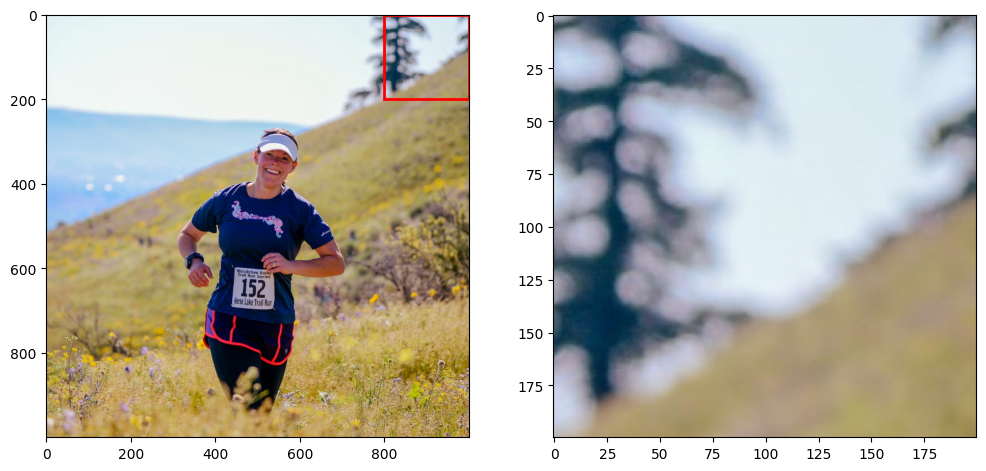

...

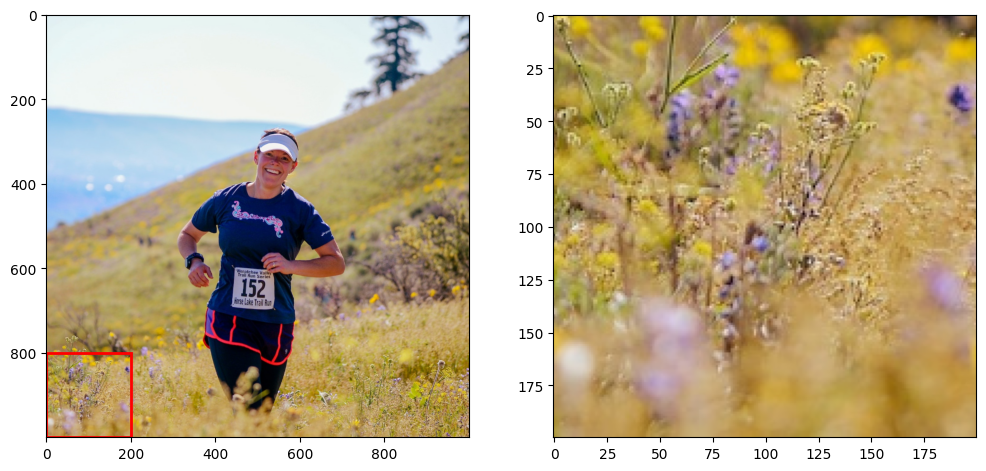

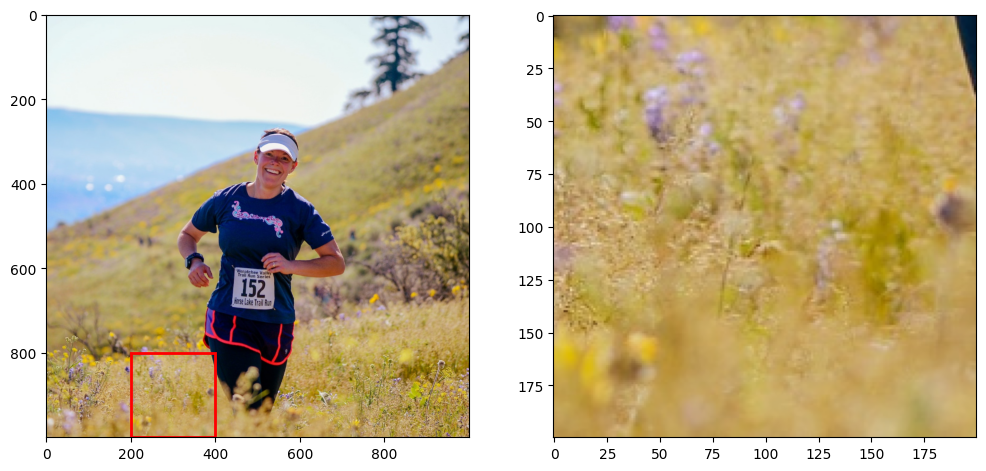

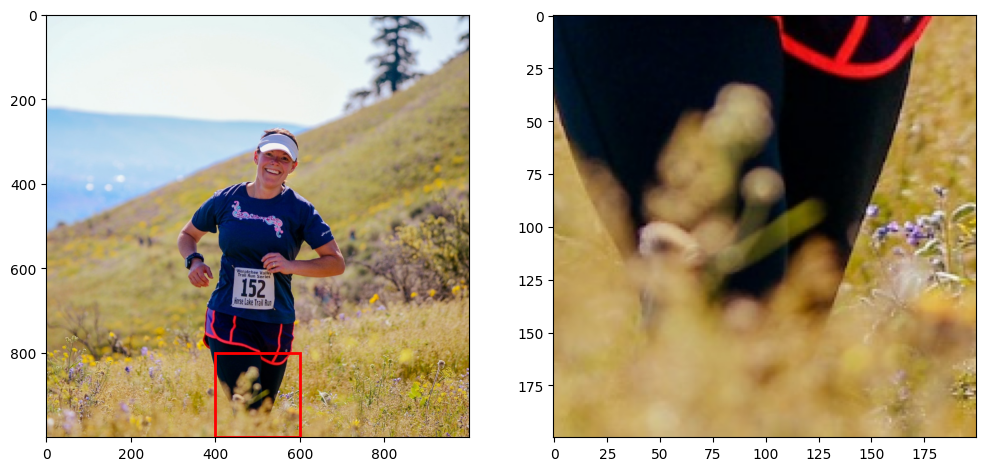

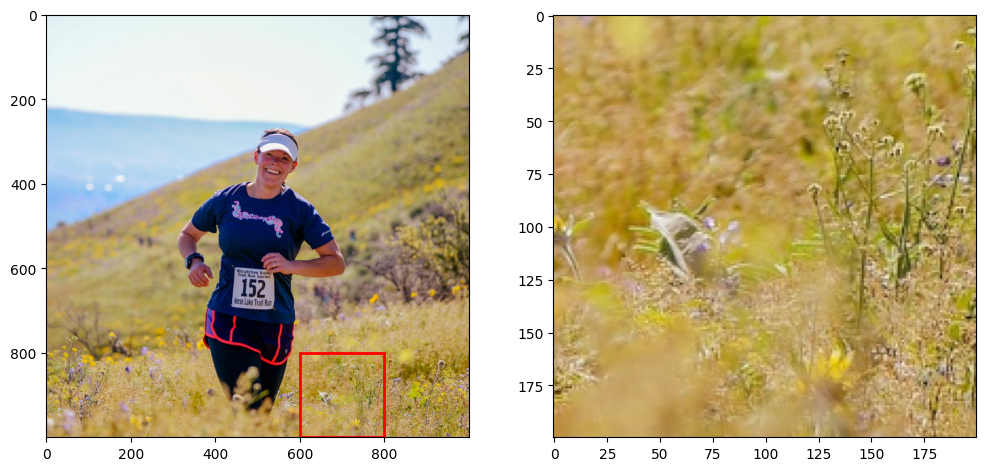

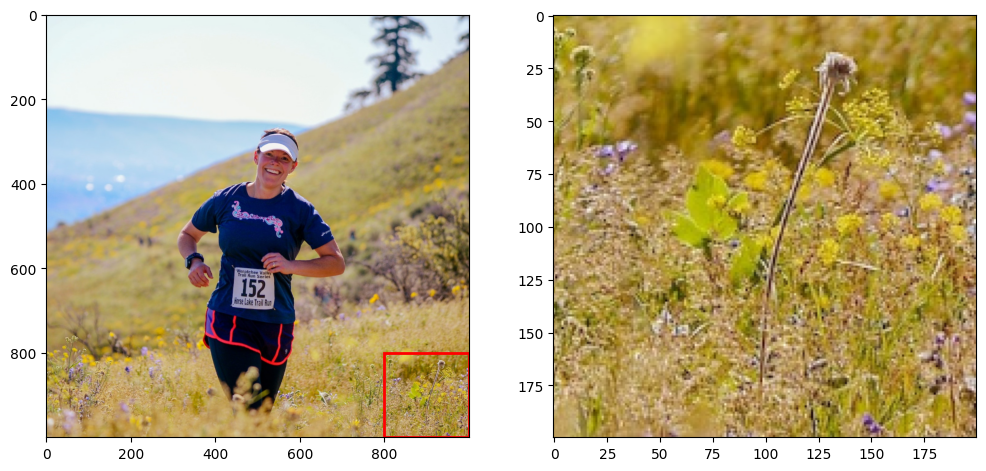

In [ ]:
for x, window in enumerate(windows):
  f, axarr = plt.subplots(1, 2, figsize=(12, 12))
  axarr[0].imshow(np_image)                                                                           #not fill
  rect = patches.Rectangle((window[0], window[1]), 200, 200, linewidth = 2, edgecolor = "r" , facecolor ="none")
  axarr[0].add_patch(rect)
  axarr[1].imshow(window[2])
  f.savefig("sliding_window/" +str(x) + ".png", dpi=f.dpi )